# Домашняя работа 4 · Нейросетевые модели временных рядов

## План ноутбука
1. Загрузка данных и подготовка
2. Базовое решение с MLP
3. Улучшенное решение с RNN
4. Foundational models
5. Финальный пайплайн для Kaggle

Документация по нейросетям в ETNA: https://docs.etna.ai/stable/tutorials/202-NN_examples.html

In [2]:
import os
import json
import warnings
import logging

import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt
import random

warnings.simplefilter(action="ignore", category=pd.errors.SettingWithCopyWarning)
warnings.simplefilter(action="ignore", category=FutureWarning)

def set_seed(seed: int = 42):
    """Set random seed for reproducibility."""
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

In [3]:
HORIZON = 366
SEGMENT_LIMIT = 25
DATA_PATH = "https://gist.githubusercontent.com/martins0n/86ca7e632a57bb1faefa98dc8e467d17/raw/2dfa5e6acf97ae2f6a587fc5e1c629836a8af16b/train.parquet"

In [4]:
from etna.metrics import SMAPE
from etna.pipeline import Pipeline
from etna.datasets import TSDataset
from etna.analysis import plot_backtest


METRIC = SMAPE()

def evaluate_pipeline(pipeline: Pipeline, ts: TSDataset) -> float:
    '''Запускаем один фолд backtest и возвращаем средний SMAPE по всем сегментам.'''
    backtest_output = pipeline.backtest(ts=ts, metrics=[METRIC], n_folds=1)
    fold_mean = backtest_output["metrics"].groupby("fold_number")["SMAPE"].mean().iloc[0]
    plot_backtest(backtest_output["forecasts"], ts, history_len=HORIZON*2)
    return fold_mean

## 1. Загрузка данных и sanity-check
**Что сделать:**
- Здесь ничего не нужно делать =)

In [5]:
from etna.datasets import TSDataset

raw_df = pd.read_parquet(DATA_PATH)
unique_segments = raw_df["segment"].nunique()

if SEGMENT_LIMIT is not None:
    segments_to_keep = raw_df["segment"].unique()[:SEGMENT_LIMIT]
    raw_df = raw_df[raw_df["segment"].isin(segments_to_keep)]

ts = TSDataset(df=TSDataset.to_dataset(raw_df), freq="D")

In [5]:
# Не редактируй этот блок кода, он нужен для автоматической проверки

summary = {
    "n_segments": len(ts.segments),
}
print(json.dumps(summary, indent=2, ensure_ascii=False))

{
  "n_segments": 25
}


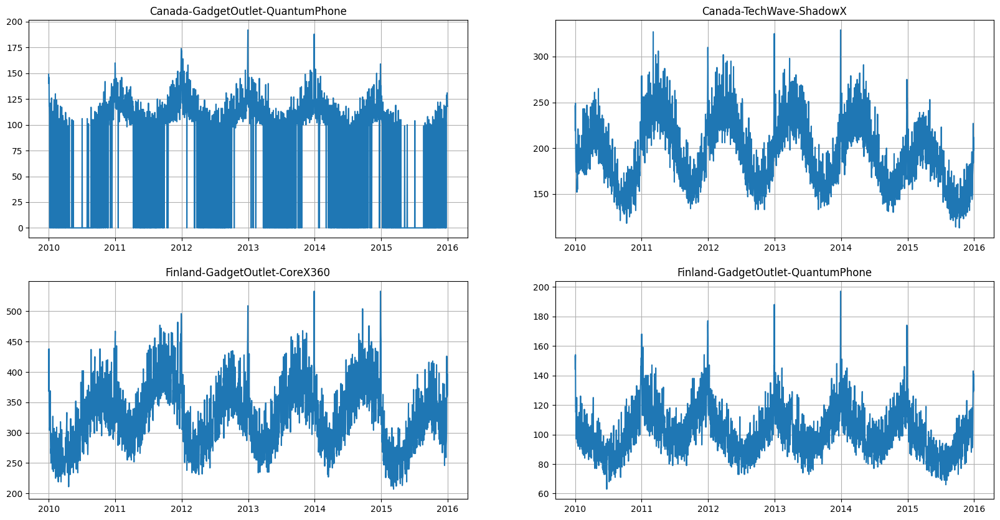

In [6]:
ts.plot(n_segments=4)

## 2. Бейзлайн: MLP
**Что сделать:**
- Построить бейзлайн с помощью MLP

In [ ]:
set_seed()

c:\Users\chizh\Desktop\Магистратура\MLOps_course\ml_env\Lib\site-packages\lightning\pytorch\utilities\parsing.py:210: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
c:\Users\chizh\Desktop\Магистратура\MLOps_course\ml_env\Lib\site-packages\lightning\pytorch\trainer\configuration_validator.py:70: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.


┏━━━┳━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name      ┃ Type           ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss      │ MSELoss        │      0 │ train │     0 │
│ 1 │ embedding │ MultiEmbedding │     56 │ train │     0 │
│ 2 │ mlp       │ Sequential     │    369 │ train │     0 │
└───┴───────────┴────────────────┴────────┴───────┴───────┘

Trainable params: 425                                                                                              
Non-trainable params: 0                                                                                            
Total params: 425                                                                                                  
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 8                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

c:\Users\chizh\Desktop\Магистратура\MLOps_course\ml_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.


`Trainer.fit` stopped: `max_epochs=50` reached.


[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   12.1s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   12.1s finished
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    1.3s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.3s finished
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


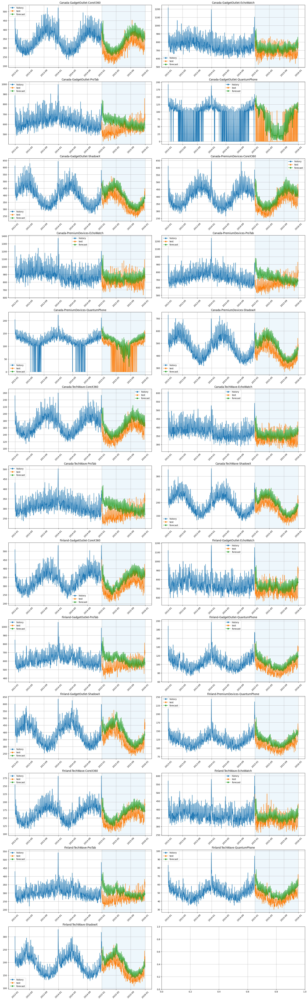

In [8]:
from etna.models.nn import MLPModel
from etna.transforms import StandardScalerTransform
from etna.transforms import LagTransform
from etna.transforms import DateFlagsTransform
from etna.transforms import LabelEncoderTransform
from etna.transforms import SegmentEncoderTransform, TimeSeriesImputerTransform


# TODO: Соберите необходимые трансформации для MLP модели
# Посмотрите в сторону лагов, datetime фич и кодирования сегментов
num_lags = 14

transform_lag = LagTransform(
    in_column="target",
    lags=[HORIZON + i for i in range(num_lags)],
    out_column="target_lag",
)
transform_date = DateFlagsTransform(
    day_number_in_week=True,
    day_number_in_month=False,
    day_number_in_year=False,
    week_number_in_month=False,
    week_number_in_year=False,
    month_number_in_year=False,
    season_number=False,
    year_number=False,
    is_weekend=False,
    out_column="dateflag",
)
segment_encoder = SegmentEncoderTransform()
label_encoder = LabelEncoderTransform(
    in_column="dateflag_day_number_in_week", strategy="none", out_column="dateflag_day_number_in_week_label"
)

mlp_transforms = [transform_lag, transform_date, label_encoder]

embedding_sizes = {"dateflag_day_number_in_week_label": (7, 7)}

mlp_model = MLPModel(
    input_size=num_lags,
    hidden_size=[16],
    embedding_sizes=embedding_sizes,
    decoder_length=HORIZON,
    trainer_params=dict(max_epochs=50, gradient_clip_val=0.1),
    lr=0.001,
    train_batch_size=16,
)

mlp_pipeline = Pipeline(
    model=mlp_model,
    transforms=mlp_transforms,
    horizon=HORIZON,
)


mlp_smape = evaluate_pipeline(mlp_pipeline, ts)

In [9]:
# Не редактируй этот блок кода, он нужен для автоматической проверки

result = {
        "mlp_smape": mlp_smape, # < 23
}
print(json.dumps(result, indent=2, ensure_ascii=False))

{
  "mlp_smape": 21.54621451239417
}


## 3. RNN vs RNN: дефолтная версия и улучшенная
**Что сделать:**
- Построить два решения с RNN: дефолтное (без признаков) и улучшенное

In [10]:
set_seed()

c:\Users\chizh\Desktop\Магистратура\MLOps_course\ml_env\Lib\site-packages\lightning\pytorch\utilities\parsing.py:210: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
c:\Users\chizh\Desktop\Магистратура\MLOps_course\ml_env\Lib\site-packages\lightning\pytorch\trainer\configuration_validator.py:70: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.
c:\Users\chizh\Desktop\Магистратура\MLOps_course\ml_env\Lib\site-packages\lightning\pytorch\callbacks\model_checkpoint.py:881: Checkpoint directory c:\Users\chizh\Desktop\Магистратура\MLOps_course\TimeSeries\checkpo

┏━━━┳━━━━━━━━━━━━┳━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name       ┃ Type    ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━╇━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss       │ MSELoss │      0 │ train │     0 │
│ 1 │ rnn        │ LSTM    │  3.4 K │ train │     0 │
│ 2 │ projection │ Linear  │     17 │ train │     0 │
└───┴────────────┴─────────┴────────┴───────┴───────┘

Trainable params: 3.4 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 3.4 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 3                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

c:\Users\chizh\Desktop\Магистратура\MLOps_course\ml_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.


`Trainer.fit` stopped: `max_epochs=10` reached.


[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed: 14.2min
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed: 14.2min finished
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    0.7s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


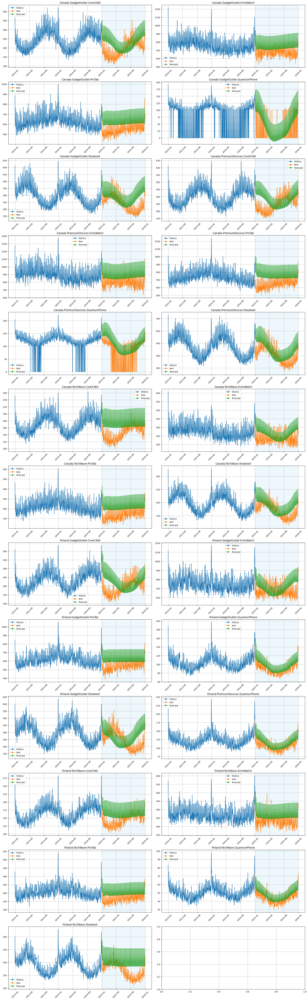

In [11]:
from etna.models.nn import RNNModel

rnn_baseline_transforms = [
    StandardScalerTransform(in_column="target"),
]

#TODO: Настройте RNN модель с дефолтными параметрами (без фич)

rnn_baseline_model = RNNModel(
    decoder_length=HORIZON,
    # Ваши параметры модели
    input_size=1,
    encoder_length=14,
    hidden_size=16,
    lr=0.001,
    trainer_params=dict(max_epochs=10),
    train_batch_size=16,
)

rnn_baseline_pipeline = Pipeline(
    model=rnn_baseline_model,
    horizon=HORIZON,
    transforms=rnn_baseline_transforms,
)

rnn_baseline_smape = evaluate_pipeline(rnn_baseline_pipeline, ts=ts)

In [12]:
set_seed()

c:\Users\chizh\Desktop\Магистратура\MLOps_course\ml_env\Lib\site-packages\lightning\pytorch\utilities\parsing.py:210: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
c:\Users\chizh\Desktop\Магистратура\MLOps_course\ml_env\Lib\site-packages\lightning\pytorch\trainer\configuration_validator.py:70: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.
c:\Users\chizh\Desktop\Магистратура\MLOps_course\ml_env\Lib\site-packages\lightning\pytorch\callbacks\model_checkpoint.py:881: Checkpoint directory c:\Users\chizh\Desktop\Магистратура\MLOps_course\TimeSeries\checkpo

┏━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name       ┃ Type           ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ loss       │ MSELoss        │      0 │ train │     0 │
│ 1 │ embedding  │ MultiEmbedding │     56 │ train │     0 │
│ 2 │ rnn        │ LSTM           │  4.3 K │ train │     0 │
│ 3 │ projection │ Linear         │     17 │ train │     0 │
└───┴────────────┴────────────────┴────────┴───────┴───────┘

Trainable params: 4.4 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 4.4 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 6                                                                                           
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

c:\Users\chizh\Desktop\Магистратура\MLOps_course\ml_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.


`Trainer.fit` stopped: `max_epochs=5` reached.


[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:  4.7min
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:  4.7min finished
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.9s finished
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


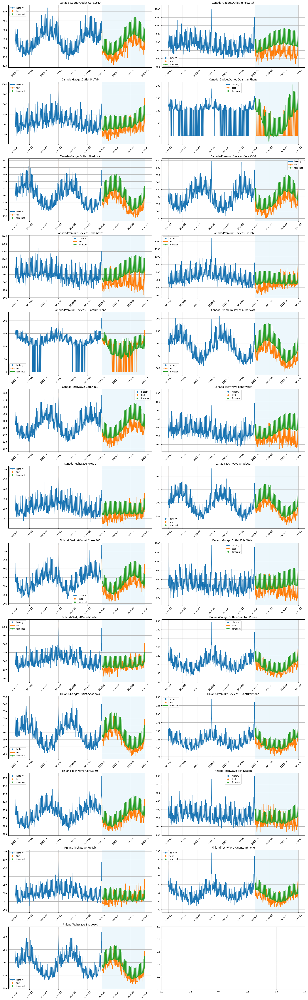

In [13]:
from etna.models.nn import RNNModel


# TODO: Улучшите базовую RNN модель
num_lags = 7

scaler = StandardScalerTransform(in_column="target")
transform_lag = LagTransform(
    in_column="target",
    lags=[HORIZON + i for i in range(num_lags)],
    out_column="target_lag",
)
transform_date = DateFlagsTransform(
    day_number_in_week=True,
    day_number_in_month=False,
    day_number_in_year=False,
    week_number_in_month=False,
    week_number_in_year=False,
    month_number_in_year=False,
    season_number=False,
    year_number=False,
    is_weekend=False,
    out_column="dateflag",
)
segment_encoder = SegmentEncoderTransform()
label_encoder = LabelEncoderTransform(
    in_column="dateflag_day_number_in_week", strategy="none", out_column="dateflag_day_number_in_week_label"
)

embedding_sizes = {"dateflag_day_number_in_week_label": (7, 7)}

rnn_modified_transforms = [
    scaler,
    transform_date,
    transform_lag,
    segment_encoder,
    label_encoder
]


rnn_modified_model = RNNModel(
    input_size=num_lags + 1,
    encoder_length=2 * HORIZON,
    decoder_length=HORIZON,
    embedding_sizes=embedding_sizes,
    trainer_params=dict(max_epochs=5),
    lr=1e-3,
)


rnn_modified_pipeline = Pipeline(
    model=rnn_modified_model,
    horizon=HORIZON,
    transforms=rnn_modified_transforms,
)

rnn_modified_smape = evaluate_pipeline(rnn_modified_pipeline, ts=ts)

In [14]:
# Не редактируй этот блок кода, он нужен для автоматической проверки

result = {
    "rnn_baseline_smape": rnn_baseline_smape,  # < 30
    "rnn_modified_smape": rnn_modified_smape,  # < 25
    "compared": bool(rnn_modified_smape < rnn_baseline_smape)
}
print(json.dumps(result, indent=2, ensure_ascii=False))

{
  "rnn_baseline_smape": 22.87731478000039,
  "rnn_modified_smape": 19.189606789982452,
  "compared": true
}


## 4. Foundational model: Chronos
**Что сделать:**


In [15]:
set_seed()

config.json: 0.00B [00:00, ?B/s]

c:\Users\chizh\Desktop\Магистратура\MLOps_course\ml_env\Lib\site-packages\huggingface_hub\file_download.py:143: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\chizh\.etna\chronos-models\chronos-bolt\models--amazon--chronos-bolt-tiny. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(message)
Xet Storage is enabled for this repo, but the 'hf_xet' package is not install

model.safetensors:   0%|          | 0.00/34.6M [00:00<?, ?B/s]

Error while downloading from https://huggingface.co/amazon/chronos-bolt-tiny/resolve/main/model.safetensors: HTTPSConnectionPool(host='cas-bridge.xethub.hf.co', port=443): Read timed out.
Trying to resume download...


model.safetensors:   0%|          | 0.00/34.6M [00:00<?, ?B/s]

[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
c:\Users\chizh\Desktop\Магистратура\MLOps_course\ml_env\Lib\site-packages\etna\libs\chronos\chronos_bolt.py:638: UserWarning: We recommend keeping prediction length <= 64. The quality of longer predictions may degrade since the model is not optimized for it. 
  warnings.warn(msg)
Passing a tuple of `past_key_values` is deprecated and will be removed in Transformers v4.48.0. You should pass an instance of `EncoderDecoderCache` instead, e.g. `past_key_values=EncoderDecoderCache.from_legacy_cache(past_key_values)`.
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    1.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.0s finished
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


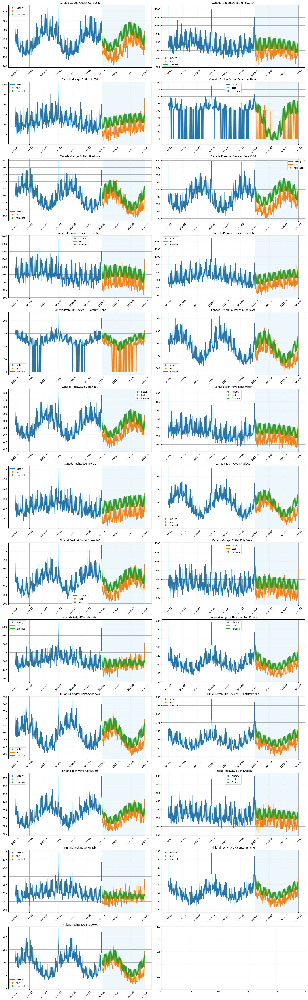

In [16]:
from etna.models.nn import ChronosBoltModel

chronos_model = ChronosBoltModel(
    path_or_url="amazon/chronos-bolt-tiny",
    encoder_length= ts.size()[0]//2,
    device="cpu"
)

chronos_pipeline = Pipeline(
    model=chronos_model,
    horizon=HORIZON,
)

chronos_smape = evaluate_pipeline(chronos_pipeline, ts=ts)

In [17]:
# Не редактируй этот блок кода, он нужен для автоматической проверки

result = {
    "chronos_smape": chronos_smape,  # < 25
}
print(json.dumps(result, indent=2, ensure_ascii=False))

{
  "chronos_smape": 23.228517763717406
}


## 5. Сделайте пайплайн для финального прогноза для kaggle
**Что сделать:**
- Выберите ваш пайплайн
- Здесь можно экспериментировать с разными стратегиями агрегации прогнозов по сегментам и т.д.
- Запускать backtest в этом задании не нужно, но сделайте это для себя локально, чтобы убедиться, что ваш пайплайн работает лучше других

In [10]:
import json
from etna.pipeline import Pipeline
from etna.models.nn import RNNModel


# TODO: Соберите пайплайн для финального прогноза на тестовый период для kaggle
num_lags = 7

scaler = StandardScalerTransform(in_column="target")
transform_lag = LagTransform(
    in_column="target",
    lags=[HORIZON + i for i in range(num_lags)],
    out_column="target_lag",
)
transform_date = DateFlagsTransform(
    day_number_in_week=True,
    day_number_in_month=False,
    day_number_in_year=False,
    week_number_in_month=False,
    week_number_in_year=False,
    month_number_in_year=False,
    season_number=False,
    year_number=False,
    is_weekend=False,
    out_column="dateflag",
)
segment_encoder = SegmentEncoderTransform()
label_encoder = LabelEncoderTransform(
    in_column="dateflag_day_number_in_week", strategy="none", out_column="dateflag_day_number_in_week_label"
)

embedding_sizes = {"dateflag_day_number_in_week_label": (7, 7)}

transforms = [
    scaler,
    transform_date,
    transform_lag,
    segment_encoder,
    label_encoder
]

model = RNNModel(
    input_size=num_lags + 1,
    encoder_length=2 * HORIZON,
    decoder_length=HORIZON,
    embedding_sizes=embedding_sizes,
    trainer_params=dict(max_epochs=5),
    lr=1e-3,
)

pipe = Pipeline(
    model=model,
    horizon=HORIZON,
    transforms=transforms,
)

c:\Users\chizh\Desktop\Магистратура\MLOps_course\ml_env\Lib\site-packages\lightning\pytorch\utilities\parsing.py:210: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.


In [11]:
# Не редактируй этот блок кода, он нужен для автоматической проверки

result = {
    "сurrent_pipeline": pipe.horizon
}

print(json.dumps(result))

{"\u0441urrent_pipeline": 366}


In [28]:
# Ваш код для финального сабмита в kaggle ниже.

raw_df = pd.read_parquet(DATA_PATH)

ts = TSDataset(df=raw_df.copy(), freq="D")

KEY_FOR_KAGGLE_SUB = "https://gist.githubusercontent.com/martins0n/86ca7e632a57bb1faefa98dc8e467d17/raw/78d9024a09d3eaa57129a57d0f96610c1d80e0d7/key_for_submission.csv"

pipe.fit(ts)
forecast_ts = pipe.forecast(ts)
forecast_df = forecast_ts.to_pandas(flatten=True)

df_submission_example = pd.read_csv(KEY_FOR_KAGGLE_SUB)
df_submission_example["timestamp"] = df_submission_example["timestamp"].apply(pd.to_datetime)

assert len(forecast_df) == len(df_submission_example)

df_submission = df_submission_example.merge(
    forecast_df[["segment", "timestamp", "target"]],
    on=["segment", "timestamp"]
)[["id", "target"]]
df_submission.to_csv("submission_nn.csv", index=False)

💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
c:\Users\chizh\Desktop\Магистратура\MLOps_course\ml_env\Lib\site-packages\lightning\pytorch\trainer\configuration_validator.py:70: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.
c:\Users\chizh\Desktop\Магистратура\MLOps_course\ml_env\Lib\site-packages\lightning\pytorch\callbacks\model_checkpoint.py:881: Checkpoint directory c:\Users\chizh\Desktop\Магистратура\MLOps_course\TimeSeries\checkpoints exists and is not empty.


┏━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━┳━━━━━━━┓
┃   ┃ Name       ┃ Type           ┃ Params ┃ Mode ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━╇━━━━━━━┩
│ 0 │ loss       │ MSELoss        │      0 │ eval │     0 │
│ 1 │ embedding  │ MultiEmbedding │     56 │ eval │     0 │
│ 2 │ rnn        │ LSTM           │  4.3 K │ eval │     0 │
│ 3 │ projection │ Linear         │     17 │ eval │     0 │
└───┴────────────┴────────────────┴────────┴──────┴───────┘

Trainable params: 4.4 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 4.4 K                                                                                                
Total estimated model params size (MB): 0                                                                          
Modules in train mode: 0                                                                                           
Modules in eval mode: 6                                                                                            
Total FLOPs: 0

Output()

c:\Users\chizh\Desktop\Магистратура\MLOps_course\ml_env\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.
c:\Users\chizh\Desktop\Магистратура\MLOps_course\ml_env\Lib\site-packages\lightning\pytorch\loops\fit_loop.py:534: Found 7 module(s) in eval mode at the start of training. This may lead to unexpected behavior during training. If this is intentional, you can ignore this warning.


`Trainer.fit` stopped: `max_epochs=5` reached.


In [ ]:
forecast_df

,timestamp,segment,target,country,product,store
0,2010-01-01,Canada-GadgetOutlet-CoreX360,404.0,Canada,CoreX360,Gadget Outlet
1,2010-01-02,Canada-GadgetOutlet-CoreX360,390.0,Canada,CoreX360,Gadget Outlet
2,2010-01-03,Canada-GadgetOutlet-CoreX360,415.0,Canada,CoreX360,Gadget Outlet
3,2010-01-04,Canada-GadgetOutlet-CoreX360,323.0,Canada,CoreX360,Gadget Outlet
4,2010-01-05,Canada-GadgetOutlet-CoreX360,307.0,Canada,CoreX360,Gadget Outlet
...,...,...,...,...,...,...
192803,2015-12-27,Singapore-TechWave-ShadowX,272.0,Singapore,ShadowX,TechWave
192804,2015-12-28,Singapore-TechWave-ShadowX,257.0,Singapore,ShadowX,TechWave
192805,2015-12-29,Singapore-TechWave-ShadowX,285.0,Singapore,ShadowX,TechWave
192806,2015-12-30,Singapore-TechWave-ShadowX,279.0,Singapore,ShadowX,TechWave


In [27]:
df_submission_example

,id,segment,timestamp
0,0,Canada-TechWave-EchoWatch,2016-01-01
1,1,Canada-TechWave-ProTab,2016-01-01
2,2,Canada-TechWave-CoreX360,2016-01-01
3,3,Canada-TechWave-ShadowX,2016-01-01
4,4,Canada-GadgetOutlet-QuantumPhone,2016-01-01
...,...,...,...
32203,32203,Singapore-PremiumDevices-QuantumPhone,2016-12-31
32204,32204,Singapore-PremiumDevices-EchoWatch,2016-12-31
32205,32205,Singapore-PremiumDevices-ProTab,2016-12-31
32206,32206,Singapore-PremiumDevices-CoreX360,2016-12-31
